In [1]:
import os
import librosa
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import librosa.display as disp
from sklearn.metrics import classification_report,plot_confusion_matrix, accuracy_score, make_scorer
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn import tree
import IPython
import time
from sklearn import metrics
import tensorflow
from tensorflow.keras.layers import Dense, Dropout, Conv1D, AveragePooling1D, MaxPooling1D, Flatten
from keras.models import Sequential
from sklearn.naive_bayes import GaussianNB as GNB
from keras.callbacks import ReduceLROnPlateau
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings("ignore")

### 1. Load Dataset

In [2]:
path = "./Audio_Dataset"
directories = os.listdir(path)
print(directories)

['Actor_01', 'Actor_02', 'Actor_03', 'Actor_04', 'Actor_05', 'Actor_06', 'Actor_07', 'Actor_08', 'Actor_09', 'Actor_10', 'Actor_11', 'Actor_12', 'Actor_13', 'Actor_14', 'Actor_15', 'Actor_16', 'Actor_17', 'Actor_18', 'Actor_19', 'Actor_20', 'Actor_21', 'Actor_22', 'Actor_23', 'Actor_24']


In [20]:
files = []
target1 = []
for sub_dir in directories:
    temp_actor = os.listdir(path+"/"+sub_dir)
    for ele in temp_actor:
        temp = ele.split("-")
        target1.append(int(temp[2]))
        files.append(path+"/"+sub_dir+"/"+ele)

### 2. EDA

<AxesSubplot:ylabel='count'>

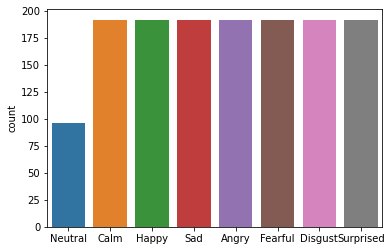

In [21]:
emotion = { 1: "Neutral", 2: "Calm", 3: "Happy", 4: "Sad", 5: "Angry", 6: "Fearful",7: "Disgust",8:"Surprised"}
emotions = []
for ele in target1:
    emotions.append(emotion[ele])
sns.countplot(emotions)

In [5]:
dataset = []
signals = []
rates = []
for file in files:
    sig, rate = librosa.load(file)
    signals.append(sig)
    rates.append(rate)
    mfcc = np.mean(librosa.feature.mfcc(y= sig, sr= rate, n_mfcc=40).T,axis=0)
    dataset.append(mfcc)

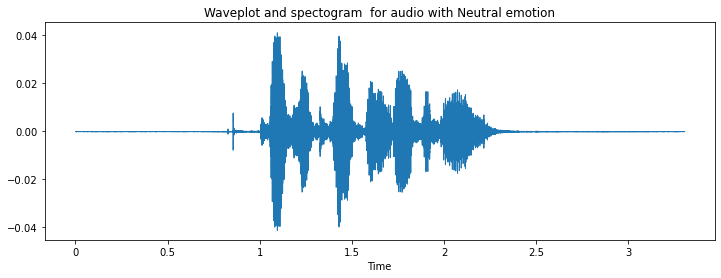

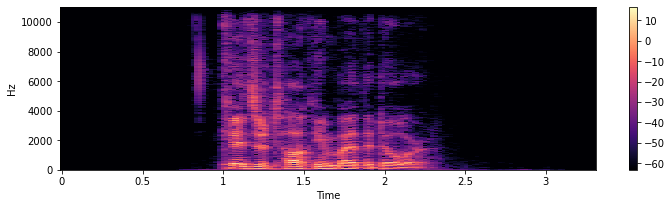

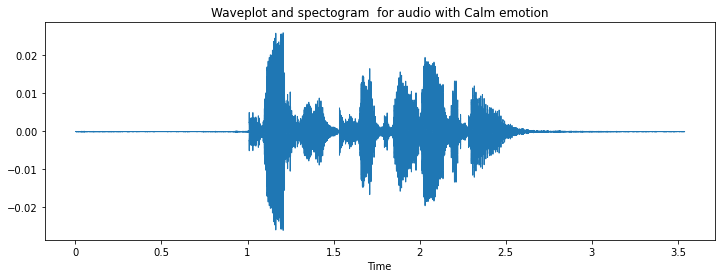

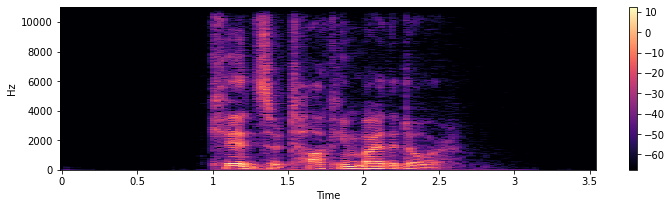

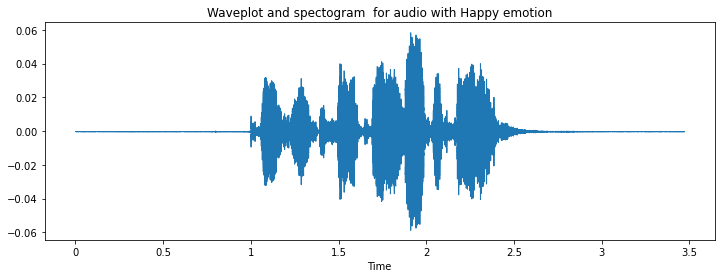

...

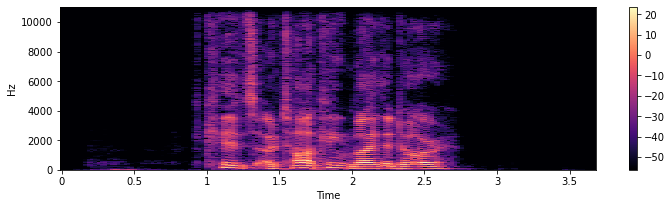

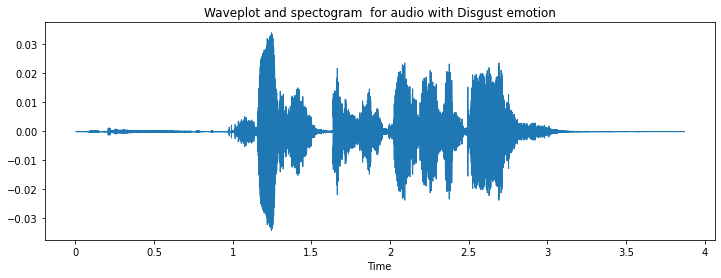

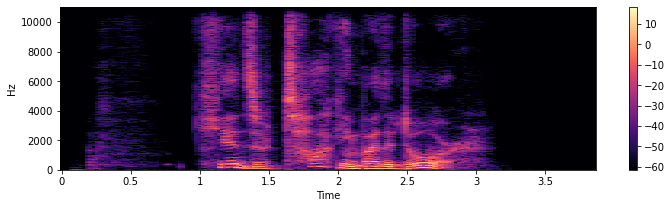

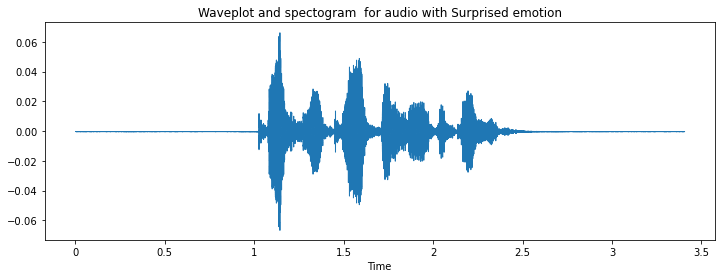

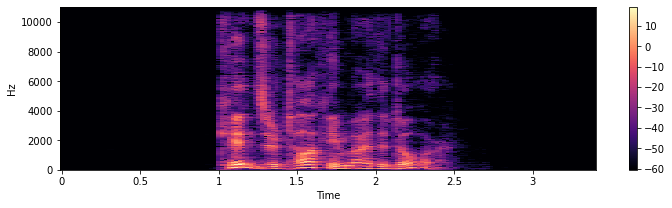

In [22]:
for i in range(1,9):
    counter = -1
    for ele in target1:
        counter += 1
        if ele == i:
            plt.figure(figsize=(12, 4))
            disp.waveshow(signals[counter], sr = rates[counter])
            plt.title("Waveplot and spectogram  for audio with "+emotion[ele]+" emotion")
            plt.show()
            amp = librosa.stft(signals[counter])
            db = librosa.amplitude_to_db(abs(amp))
            plt.figure(figsize=(12, 3))
            disp.specshow(db, sr = rates[counter], x_axis='time', y_axis='hz')  
            plt.colorbar()
            IPython.display.display(IPython.display.Audio(files[counter]))
            time.sleep(0.01)
            break

### 3. Data Pre-Processing

In [7]:
new_dataset = []
cuts = []
for file in files:
    sig, rate = librosa.load(file)
    cut = sig[round(0.75*rate, ndigits = None):round(2.5*rate, ndigits = None)]
    data = np.array(librosa.feature.mfcc(cut, n_mfcc = 50))
    new_dataset.append(data)
    cuts.append(cut)

Representation of data with leading and trailing silences clipped


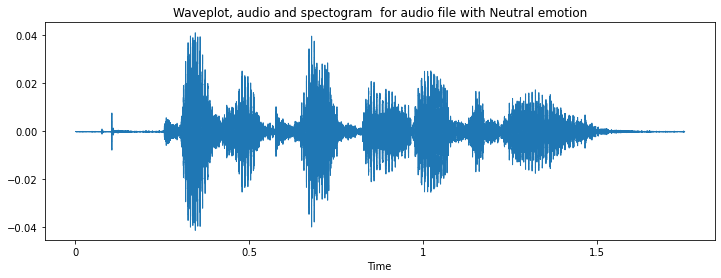

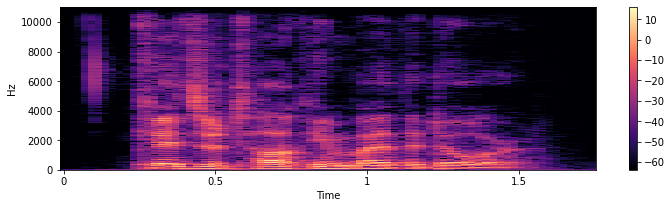

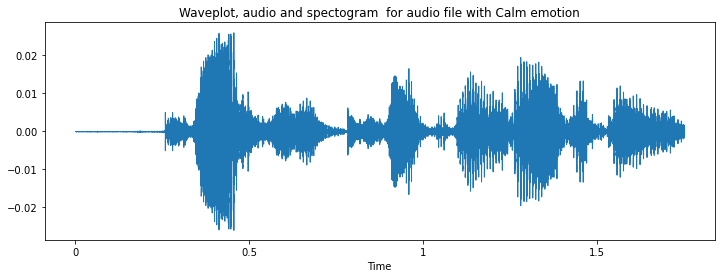

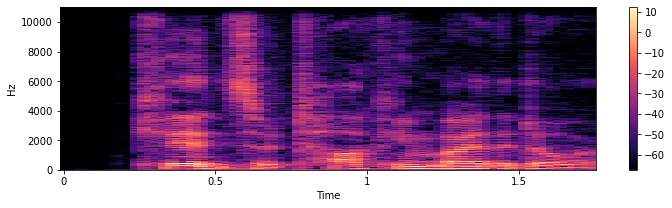

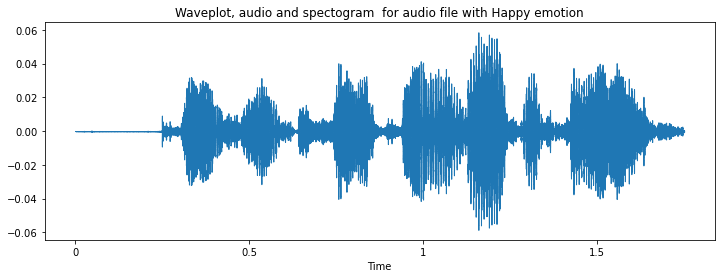

...

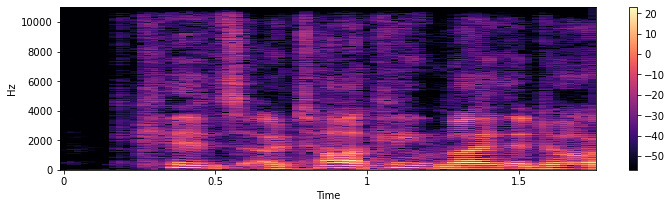

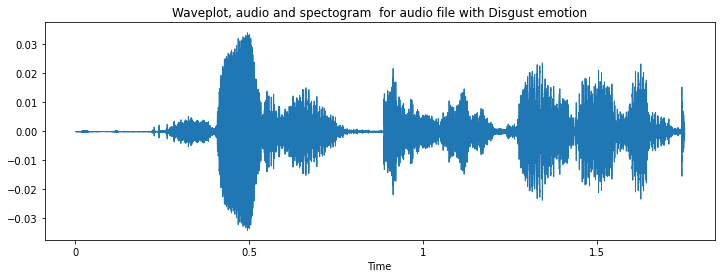

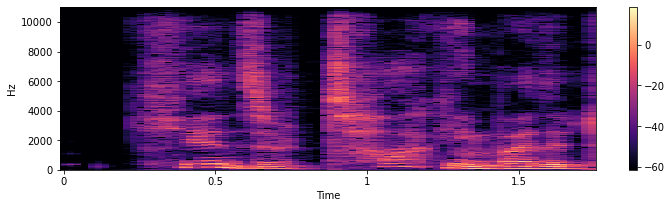

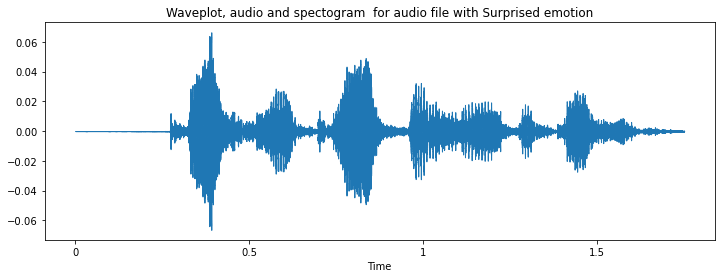

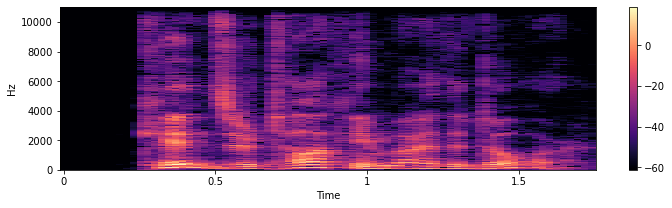

In [8]:
print('\033[1m'+"Representation of data with leading and trailing silences clipped"+'\033[0m')
for i in range(1,9):
    counter = -1
    for ele in target:
        counter += 1
        if ele == i:
            plt.figure(figsize=(12, 4))
            disp.waveshow(cuts[counter], sr = rates[counter])
            plt.title("Waveplot, audio and spectogram  for audio file with "+emotion[ele]+" emotion")
            plt.show()
            amp = librosa.stft(cuts[counter])
            db = librosa.amplitude_to_db(abs(amp))
            plt.figure(figsize=(12, 3))
            disp.specshow(db, sr = rates[counter], x_axis='time', y_axis='hz')  
            plt.colorbar()
            IPython.display.display(IPython.display.Audio(files[counter]))
            time.sleep(0.01)
            break

In [9]:
new_dataset = np.array(new_dataset)
target = np.array(target1)
dataframe = np.array((new_dataset - np.min(new_dataset))/np.max(new_dataset) - np.min(new_dataset))
dataframe = dataframe/np.std(new_dataset)
target = OneHotEncoder().fit_transform(target.reshape(-1,1)).toarray()

### 3.1 Split Dataset

In [10]:
data_train, data_test, target_train, target_test = train_test_split(dataframe, target,test_size = 0.2, random_state = 123, shuffle = True)
data_train, data_val, target_train, target_val = train_test_split(data_train, target_train,test_size = 0.2)

In [11]:
samples_train, nx_train, ny_train = data_train.shape
data_train = data_train.reshape((samples_train, nx_train*ny_train))
samples_val, nx_val, ny_val = data_val.shape
data_val = data_val.reshape((samples_val, nx_val*ny_val))
samples_test, nx_test, ny_test = data_test.shape
data_test = data_test.reshape((samples_test, nx_test*ny_test))

In [12]:
data_train = StandardScaler().fit_transform(data_train)
data_val = StandardScaler().fit_transform(data_val)
data_test = StandardScaler().fit_transform(data_test)

In [13]:
data_train = np.expand_dims(data_train, axis=2)
data_val = np.expand_dims(data_val, axis=2)
data_test = np.expand_dims(data_test, axis=2)

In [23]:
data1_train, data1_test, target1_train, target1_test = train_test_split(dataset, target1, test_size = 0.2)

### 4. Model Fitting and Result Evaluation

In [15]:
acc_train = []
acc_test = []

#### 4.1  RNN Model

In [16]:
input_shape = (data_train.shape[1])
model = Sequential()
model.add(Conv1D(256, kernel_size=6, strides=1, padding='same', activation = 'relu', input_shape = (input_shape, 1)))
model.add(AveragePooling1D(pool_size=4, strides = 2, padding = 'same'))
model.add(Dropout(0.4))
model.add(Conv1D(128,  kernel_size=6, strides=1, padding='same', activation = 'relu'))
model.add(AveragePooling1D(pool_size=4, strides = 2, padding = 'same'))
model.add(Dropout(0.4))
model.add(Conv1D(64, kernel_size=6, strides=1, padding='same', activation='relu'))
model.add(MaxPooling1D(pool_size=4, strides = 2, padding = 'same'))
model.add(Flatten())
model.add(Dense(32, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(8, activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 3800, 256)         1792      
                                                                 
 average_pooling1d (AverageP  (None, 1900, 256)        0         
 ooling1D)                                                       
                                                                 
 dropout (Dropout)           (None, 1900, 256)         0         
                                                                 
 conv1d_1 (Conv1D)           (None, 1900, 128)         196736    
                                                                 
 average_pooling1d_1 (Averag  (None, 950, 128)         0         
 ePooling1D)                                                     
                                                                 
 dropout_1 (Dropout)         (None, 950, 128)          0

For adam optimizer:


Epoch 1/20
10/10 [==============================] - 22s 2s/step - loss: 2.1105 - accuracy: 0.1249 - val_loss: 2.0712 - val_accuracy: 0.1126
Epoch 2/20
10/10 [==============================] - 21s 2s/step - loss: 2.0232 - accuracy: 0.1672 - val_loss: 2.0252 - val_accuracy: 0.1645
Epoch 3/20
10/10 [==============================] - 21s 2s/step - loss: 1.9375 - accuracy: 0.2291 - val_loss: 1.9734 - val_accuracy: 0.1861
Epoch 4/20
10/10 [==============================] - 21s 2s/step - loss: 1.7948 - accuracy: 0.3149 - val_loss: 1.9100 - val_accuracy: 0.2338
Epoch 5/20
10/10 [==============================] - 21s 2s/step - loss: 1.6962 - accuracy: 0.3236 - val_loss: 1.8607 - val_accuracy: 0.3030
Epoch 6/20
10/10 [==============================] - 21s 2s/step - loss: 1.5686 - accuracy: 0.4126 - val_loss: 1.8095 - val_accuracy: 0.3290
Epoch 7/20
10/10 [==============================] - 21s 2s/step - loss: 1.4685 - accuracy: 0.4159 - val_loss: 1.7652 - val_accuracy: 0.350

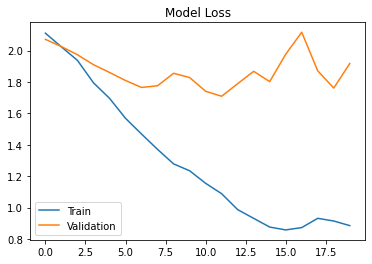

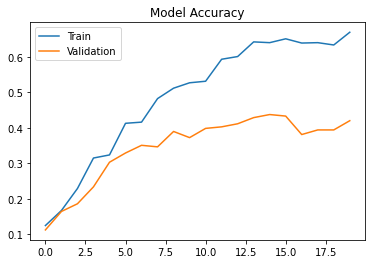

For rmsprop optimizer:


Epoch 1/20
10/10 [==============================] - 21s 2s/step - loss: 1.2911 - accuracy: 0.5820 - val_loss: 1.6974 - val_accuracy: 0.4242
Epoch 2/20
10/10 [==============================] - 21s 2s/step - loss: 0.7751 - accuracy: 0.6916 - val_loss: 1.6877 - val_accuracy: 0.4675
Epoch 3/20
10/10 [==============================] - 22s 2s/step - loss: 0.7663 - accuracy: 0.6960 - val_loss: 2.1286 - val_accuracy: 0.3939
Epoch 4/20
10/10 [==============================] - 22s 2s/step - loss: 0.7056 - accuracy: 0.7253 - val_loss: 1.9062 - val_accuracy: 0.4242
Epoch 5/20
10/10 [==============================] - 21s 2s/step - loss: 0.7669 - accuracy: 0.6873 - val_loss: 1.9157 - val_accuracy: 0.4329
Epoch 6/20
10/10 [==============================] - 26s 3s/step - loss: 0.7329 - accuracy: 0.7210 - val_loss: 1.9216 - val_accuracy: 0.4329
Epoch 7/20
10/10 [==============================] - 27s 3s/step - loss: 0.6050 - accuracy: 0.7600 - val_loss: 2.2712 - val_accuracy: 0.

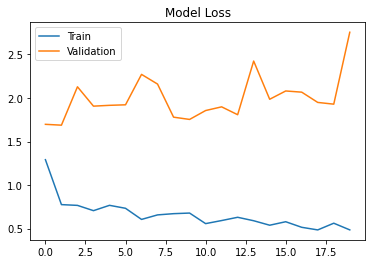

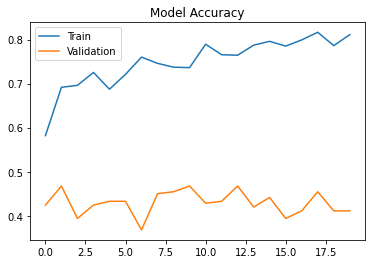

For sgd optimizer:


Epoch 1/20
10/10 [==============================] - 21s 2s/step - loss: 0.4452 - accuracy: 0.8241 - val_loss: 2.2473 - val_accuracy: 0.4372
Epoch 2/20
10/10 [==============================] - 24s 2s/step - loss: 0.4339 - accuracy: 0.8187 - val_loss: 2.1990 - val_accuracy: 0.4329
Epoch 3/20
10/10 [==============================] - 26s 3s/step - loss: 0.4144 - accuracy: 0.8252 - val_loss: 2.1968 - val_accuracy: 0.4416
Epoch 4/20
10/10 [==============================] - 26s 3s/step - loss: 0.4309 - accuracy: 0.8317 - val_loss: 2.2222 - val_accuracy: 0.4372
Epoch 5/20
10/10 [==============================] - 25s 3s/step - loss: 0.4219 - accuracy: 0.8480 - val_loss: 2.1685 - val_accuracy: 0.4416
Epoch 6/20
10/10 [==============================] - 26s 3s/step - loss: 0.4109 - accuracy: 0.8328 - val_loss: 2.2189 - val_accuracy: 0.4502
Epoch 7/20
10/10 [==============================] - 26s 3s/step - loss: 0.3753 - accuracy: 0.8491 - val_loss: 2.2607 - val_accuracy: 0.4242

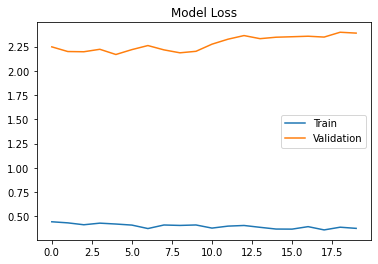

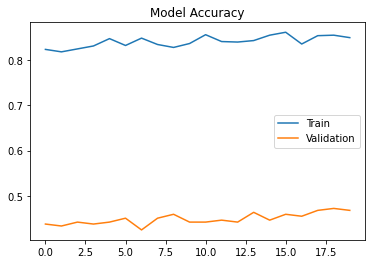

Best optimizer for our model is sgd with accuracy of 0.5555555820465088


In [17]:
optimizers = ['adam', 'rmsprop', 'sgd']
best_optim = ''
best_acc = 0
best_train_acc = 0
for optim in optimizers:
    print("For "+optim+" optimizer:\n\n")
    model.compile(optimizer = optim,loss = 'categorical_crossentropy', metrics = ['accuracy'])
    results = model.fit(data_train, target_train, epochs = 20, batch_size = 100, validation_data = (data_val, target_val), shuffle = False)
    ls, acc = model.evaluate(data_test,target_test)
    print("\n Model loss is: "+str(ls)+ " and model accuracy is: "+str(acc))
    results_dict = results.history
    if best_acc < acc:
        best_optim = optim
        best_acc = acc
        best_train_acc = results_dict['accuracy'][-1]
    train_loss_list = results_dict['loss']
    train_acc_list = results_dict['accuracy']
    val_loss_list = results_dict['val_loss']
    val_acc_list = results_dict['val_accuracy']
    plt.plot(train_loss_list)
    plt.plot(val_loss_list)
    plt.legend(['Train','Validation'])
    plt.title("Model Loss")
    plt.show()
    plt.plot(train_acc_list)
    plt.plot(val_acc_list)
    plt.legend(['Train','Validation'])
    plt.title("Model Accuracy")
    plt.show()
print('\033[1m'+"Best optimizer for our model is "+best_optim+" with accuracy of "+str(best_acc)+'\033[0m')

In [18]:
acc_train.append(best_train_acc)
acc_test.append(best_acc)

#### 4.2 Gaussian Naive Bayes Classifier

Test Accuracy  0.3541666666666667
Train Accuracy  0.3680555555555556
              precision    recall  f1-score   support

           1       0.16      0.47      0.24        17
           2       0.35      0.45      0.39        29
           3       0.38      0.28      0.32        36
           4       0.33      0.14      0.20        42
           5       0.54      0.43      0.48        44
           6       0.41      0.38      0.39        40
           7       0.32      0.32      0.32        38
           8       0.41      0.45      0.43        42

    accuracy                           0.35       288
   macro avg       0.36      0.36      0.35       288
weighted avg       0.38      0.35      0.36       288



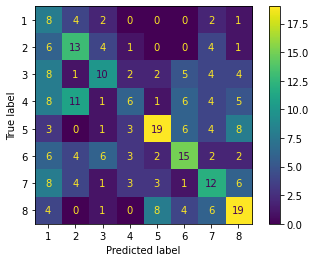

In [24]:
bayes = GNB().fit(data1_train,target1_train)
predictionTest = bayes.predict(data1_test)
predictionTrain = bayes.predict(data1_train)
print("Test Accuracy ",accuracy_score(target1_test,predictionTest))
print("Train Accuracy ",accuracy_score(target1_train,predictionTrain))
print(classification_report(target1_test,predictionTest))
plot_confusion_matrix(bayes,data1_test,target1_test)
acc_train.append(accuracy_score(target1_train,predictionTrain))
acc_test.append(accuracy_score(target1_test,predictionTest))

#### 4.3 Decision Tree Classifier

Test Accuracy  0.3472222222222222
Train Accuracy  1.0
              precision    recall  f1-score   support

           1       0.16      0.18      0.17        17
           2       0.41      0.48      0.44        29
           3       0.31      0.39      0.35        36
           4       0.48      0.31      0.38        42
           5       0.49      0.50      0.49        44
           6       0.32      0.23      0.26        40
           7       0.27      0.39      0.32        38
           8       0.29      0.24      0.26        42

    accuracy                           0.35       288
   macro avg       0.34      0.34      0.33       288
weighted avg       0.36      0.35      0.35       288



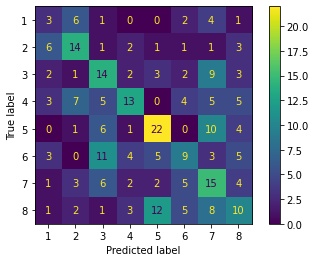

In [25]:
DTC = tree.DecisionTreeClassifier(criterion = 'gini').fit(data1_train, target1_train)
predictionTest = DTC.predict(data1_test)
predictionTrain = DTC.predict(data1_train)
print("Test Accuracy ",accuracy_score(target1_test,predictionTest))
print("Train Accuracy ",accuracy_score(target1_train,predictionTrain))
print(classification_report(target1_test,predictionTest))
plot_confusion_matrix(DTC,data1_test,target1_test)
acc_train.append(accuracy_score(target1_train,predictionTrain))
acc_test.append(accuracy_score(target1_test,predictionTest))

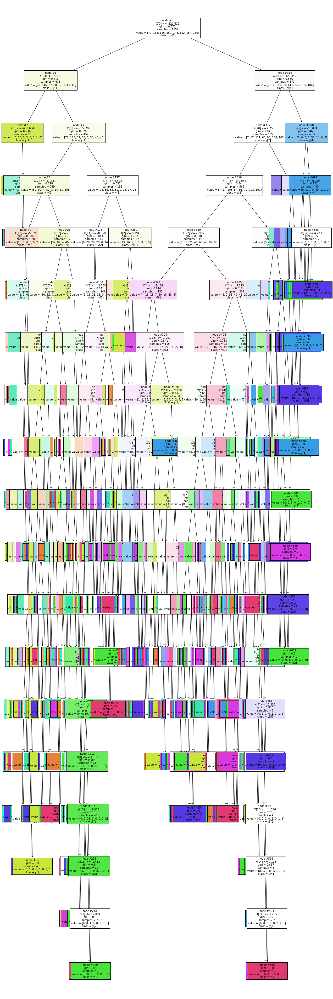

In [26]:
# Print Decision Tree
plt.figure(figsize=(20,70))
tree.plot_tree(DTC,filled=True,fontsize=10,node_ids=True,class_names=True)
plt.show()

#### 4.4 Decision Tree with Hypertuning

Test Accuracy  0.3055555555555556
Train Accuracy  0.3550347222222222
              precision    recall  f1-score   support

           1       0.00      0.00      0.00        17
           2       0.27      0.86      0.41        29
           3       0.00      0.00      0.00        36
           4       0.21      0.14      0.17        42
           5       0.68      0.30      0.41        44
           6       0.28      0.35      0.31        40
           7       0.29      0.29      0.29        38
           8       0.33      0.45      0.38        42

    accuracy                           0.31       288
   macro avg       0.26      0.30      0.25       288
weighted avg       0.29      0.31      0.27       288



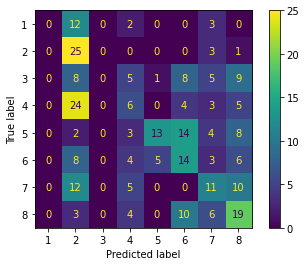

In [27]:
estimator = tree.DecisionTreeClassifier(random_state=1)

parameters = {'max_depth': np.arange(1,10), 
              'min_samples_leaf': [1, 2, 5, 10,15,20],
              'max_leaf_nodes' : [1,2, 5, 10],
              'min_impurity_decrease': [0.1,0.01,0.001]
             }

acc_scorer = make_scorer(accuracy_score)

grid_obj_dtc = GridSearchCV(estimator, parameters, scoring=acc_scorer,cv=5)
grid_obj_dtc = grid_obj_dtc.fit(data1_train, target1_train)

estimator = grid_obj_dtc.best_estimator_

estimator.fit(data1_train, target1_train)
predictionTest = estimator.predict(data1_test)
predictionTrain = estimator.predict(data1_train)
print("Test Accuracy ",accuracy_score(target1_test,predictionTest))
print("Train Accuracy ",accuracy_score(target1_train,predictionTrain))
print(classification_report(target1_test,predictionTest))
plot_confusion_matrix(grid_obj_dtc,data1_test,target1_test)
acc_train.append(accuracy_score(target1_train,predictionTrain))
acc_test.append(accuracy_score(target1_test,predictionTest))

#### 4.5 Decision Tree with Bagging Classifier

Test Accuracy  0.2638888888888889
Train Accuracy  0.4982638888888889
              precision    recall  f1-score   support

           1       0.11      0.12      0.11        17
           2       0.29      0.48      0.36        29
           3       0.20      0.36      0.25        36
           4       0.21      0.14      0.17        42
           5       0.38      0.27      0.32        44
           6       0.46      0.28      0.34        40
           7       0.20      0.16      0.18        38
           8       0.30      0.29      0.29        42

    accuracy                           0.26       288
   macro avg       0.27      0.26      0.25       288
weighted avg       0.28      0.26      0.26       288



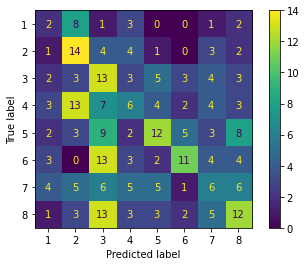

In [28]:
dec_tree = tree.DecisionTreeClassifier(criterion="entropy",max_features="auto")
bagging = BaggingClassifier(base_estimator=dec_tree, 
                            n_estimators=20,
                            max_features=5,
                            max_samples=100,
                            random_state=1, 
                            n_jobs=5)
bagging.fit(data1_train,target1_train)
predictionTest = bagging.predict(data1_test)
predictionTrain = bagging.predict(data1_train)
print("Test Accuracy ",accuracy_score(target1_test,predictionTest))
print("Train Accuracy ",accuracy_score(target1_train,predictionTrain))
print(classification_report(target1_test,predictionTest))
plot_confusion_matrix(bagging,data1_test,target1_test)
acc_train.append(accuracy_score(target1_train,predictionTrain))
acc_test.append(accuracy_score(target1_test,predictionTest))

#### 4.6 Random Forrest Classifier

Test Accuracy  0.5972222222222222
Train Accuracy  1.0
              precision    recall  f1-score   support

           1       0.58      0.41      0.48        17
           2       0.51      0.93      0.66        29
           3       0.65      0.67      0.66        36
           4       0.59      0.40      0.48        42
           5       0.66      0.70      0.68        44
           6       0.56      0.35      0.43        40
           7       0.59      0.63      0.61        38
           8       0.64      0.67      0.65        42

    accuracy                           0.60       288
   macro avg       0.60      0.60      0.58       288
weighted avg       0.60      0.60      0.59       288



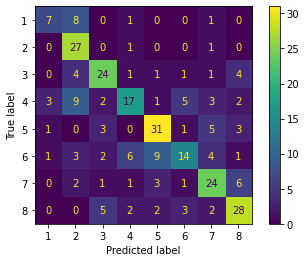

In [29]:
rfc = RandomForestClassifier().fit(data1_train,target1_train)
predictionTest = rfc.predict(data1_test)
predictionTrain = rfc.predict(data1_train)
print("Test Accuracy ",accuracy_score(target1_test,predictionTest))
print("Train Accuracy ",accuracy_score(target1_train,predictionTrain))
print(classification_report(target1_test,predictionTest))
plot_confusion_matrix(rfc,data1_test,target1_test)
acc_train.append(accuracy_score(target1_train,predictionTrain))
acc_test.append(accuracy_score(target1_test,predictionTest))

#### 4.7 Random Forrest with Hypertuning

Test Accuracy  0.40625
Train Accuracy  0.5555555555555556
              precision    recall  f1-score   support

           1       0.00      0.00      0.00        17
           2       0.30      0.83      0.44        29
           3       0.48      0.42      0.45        36
           4       0.40      0.14      0.21        42
           5       0.53      0.73      0.62        44
           6       0.36      0.23      0.28        40
           7       0.42      0.37      0.39        38
           8       0.39      0.40      0.40        42

    accuracy                           0.41       288
   macro avg       0.36      0.39      0.35       288
weighted avg       0.39      0.41      0.37       288



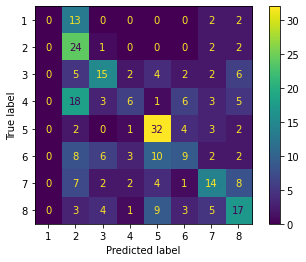

In [30]:
rf_estimator_weighted = RandomForestClassifier(random_state=1)
parameters = {
    "n_estimators": [50,100,150,200],
    "min_samples_leaf": np.arange(5, 10),
    "max_features": np.arange(0.1, 0.2, 0.5),
    "max_samples": np.arange(0.1, 0.5, 0.7),
}
acc_scorer = make_scorer(accuracy_score)

grid_obj = GridSearchCV(rf_estimator_weighted, parameters, scoring=acc_scorer,cv=5)
grid_obj = grid_obj.fit(data1_train, target1_train)

rf_estimator_weighted = grid_obj.best_estimator_

rf_estimator_weighted.fit(data1_train,target1_train)
predictionTest = rf_estimator_weighted.predict(data1_test)
predictionTrain = rf_estimator_weighted.predict(data1_train)
print("Test Accuracy ",accuracy_score(target1_test,predictionTest))
print("Train Accuracy ",accuracy_score(target1_train,predictionTrain))
print(classification_report(target1_test,predictionTest))
plot_confusion_matrix(rf_estimator_weighted,data1_test,target1_test)
acc_train.append(accuracy_score(target1_train,predictionTrain))
acc_test.append(accuracy_score(target1_test,predictionTest))

#### 4.8 KNN

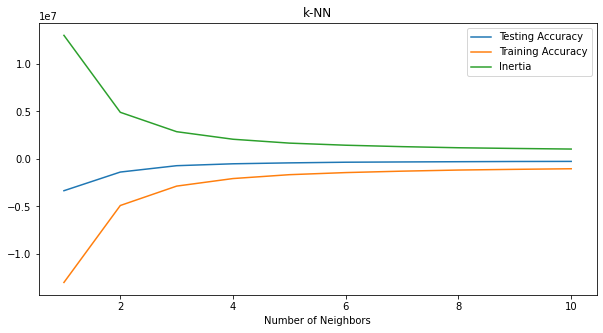

In [34]:
# Effect of number of neighbours in KNN
neighbors = np.arange(1, 11)
train_accuracy = np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))
elbow_curve = np.empty(len(neighbors))

for i, k in enumerate(neighbors):
    knn = KMeans(n_clusters= k )

    knn.fit(data1_train)
    
    train_accuracy[i] = knn.score(data1_train, target1_train)
    elbow_curve[i] = knn.inertia_
    test_accuracy[i] = knn.score(data1_test, target1_test)

plt.figure(figsize=(10,5))
plt.title('k-NN')
plt.plot(neighbors, test_accuracy, label = 'Testing Accuracy')
plt.plot(neighbors, train_accuracy, label = 'Training Accuracy')
plt.plot(neighbors, elbow_curve, label = 'Inertia')
plt.legend()
plt.xlabel('Number of Neighbors')
plt.show()

##### The best values are observed for number of clusters as 4. So, we will use K = 4 for number of clusters when fitting our model.

In [32]:
knn_model = KMeans(n_clusters = 4).fit(data1_train)
predictionTest = knn_model.predict(data1_test)
predictionTrain = knn_model.predict(data1_train)
print("Test Accuracy ",accuracy_score(target1_test,predictionTest))
print("Train Accuracy ",accuracy_score(target1_train,predictionTrain))
print(classification_report(target1_test,predictionTest))
acc_train.append(accuracy_score(target1_train,predictionTrain))
acc_test.append(accuracy_score(target1_test,predictionTest))

Test Accuracy  0.0798611111111111
Train Accuracy  0.1154513888888889
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.01      0.06      0.02        17
           2       0.31      0.55      0.40        29
           3       0.12      0.17      0.14        36
           4       0.00      0.00      0.00        42
           5       0.00      0.00      0.00        44
           6       0.00      0.00      0.00        40
           7       0.00      0.00      0.00        38
           8       0.00      0.00      0.00        42

    accuracy                           0.08       288
   macro avg       0.05      0.09      0.06       288
weighted avg       0.05      0.08      0.06       288



#### 5 Final Results

In [33]:
rnn = "RNN with "+ best_optim + " optimizer"
final_result = pd.DataFrame({'Model':[rnn,'Bayes classifier with default parameters','Decision Tree Classifier',
                                      'Decision Tree classifier with best parameters','Decision Tree with Bagging Classifier', 
                                      'Random Forest with deafult parameters', 'Random Forest Classifier with best parameters',
                                      'KNN Model with 4 clusters'], 
                                      'Train_Accuracy': acc_train,'Test_Accuracy': acc_test})

final_result

,Model,Train_Accuracy,Test_Accuracy
0,RNN with sgd optimizer,0.850163,0.555556
1,Bayes classifier with default parameters,0.368056,0.354167
2,Decision Tree Classifier,1.000000,0.347222
3,Decision Tree classifier with best parameters,0.355035,0.305556
4,Decision Tree with Bagging Classifier,0.498264,0.263889
5,Random Forest with deafult parameters,1.000000,0.597222
6,Random Forest Classifier with best parameters,0.555556,0.406250
7,KNN Model with 4 clusters,0.115451,0.079861
